In [ ]:
# Prepare paths to local utilities
import os
import sys

import matplotlib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [52]:

utils_path = os.path.abspath(os.path.join('..', 'util'))
sys.path.append(utils_path)

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [69]:
# Import the data downloader from the local utilities package (stored in the ../util folder)
from download.DataDownloader import DataDownloader
from collect.DataframeCollector import DataframeCollector

In [3]:
data_path = os.path.abspath(os.path.join('..', 'data'))

In [4]:
# Prepare data downloader
data_downloader = DataDownloader()

In [5]:
# Download the two datasets
# har70+ and harth
har70plus_success = data_downloader.download_data('har70plus', data_path)

print("HAR70+ download success: ", har70plus_success)

harth_success = data_downloader.download_data('harth', data_path)

print("HARTH download success: ", harth_success)

if not har70plus_success or not harth_success:
    print("Data download failed, please check the logs above.")

Dataset already downloaded
HAR70+ download success:  True
Dataset already downloaded
HARTH download success:  True


In [6]:
# The HAR70+ dataset is a collection of many CSV files, load the first one as a test
har70plus_files = os.path.join(data_path, 'har70plus')

har70plus_files = [os.path.join(har70plus_files, f) for f in os.listdir(har70plus_files) if f.endswith('.csv')]

har70plus_1_df = pd.read_csv(har70plus_files[0])

har70plus_1_df.head()

,timestamp,back_x,back_y,back_z,thigh_x,thigh_y,thigh_z,label
0,2021-03-24 14:42:03.839,-0.999023,-0.063477,0.140625,-0.980469,-0.112061,-0.048096,6
1,2021-03-24 14:42:03.859,-0.980225,-0.079346,0.140625,-0.961182,-0.121582,-0.051758,6
2,2021-03-24 14:42:03.880,-0.950195,-0.076416,0.140625,-0.949463,-0.080566,-0.067139,6
3,2021-03-24 14:42:03.900,-0.954834,-0.059082,0.140381,-0.957520,-0.046143,-0.050781,6
4,2021-03-24 14:42:03.920,-0.972412,-0.042969,0.142822,-0.977051,-0.023682,-0.026611,6


In [7]:
# Each record has a timestamp, we need to check if the timestamps are evenly spaced.
# This is important for the time series analysis.

# The timestamp is stored in the format: yyyy-mm-dd hh:mm:ss.000 and is a string
# We can convert it to a datetime object and then calculate the difference between each pair of timestamps
# The difference should be constant if the timestamps are evenly spaced

# Convert the timestamp to a datetime object
har70plus_1_df['timestamp'] = pd.to_datetime(har70plus_1_df['timestamp'])

# Calculate the difference between each pair of timestamps
time_diff = har70plus_1_df['timestamp'].diff()

# The first difference is NaN, so let's fill it with 0 as the difference between the first and the first timestamp is 0
time_diff[0] = pd.Timedelta(0)

# Check if the difference is constant
time_diff.value_counts()

timestamp
0 days 00:00:00.020000    62797
0 days 00:00:00.019000    20528
0 days 00:00:00.021000    20524
0 days 00:00:00               1
0 days 00:00:01.180000        1
0 days 00:00:02.060000        1
0 days 00:00:03.180000        1
0 days 00:00:03.821000        1
0 days 00:00:03.021000        1
0 days 00:00:04.861000        1
0 days 00:00:01.541000        1
0 days 00:00:02.620000        1
0 days 00:00:01.020000        1
0 days 00:00:01.940000        1
Name: count, dtype: int64

In [8]:
# The difference is not constant, we need to check the distribution of the differences
time_diff.describe()

count                       103860
mean     0 days 00:00:00.020240901
std      0 days 00:00:00.027082560
min                0 days 00:00:00
25%         0 days 00:00:00.020000
50%         0 days 00:00:00.020000
75%         0 days 00:00:00.020000
max         0 days 00:00:04.861000
Name: timestamp, dtype: object

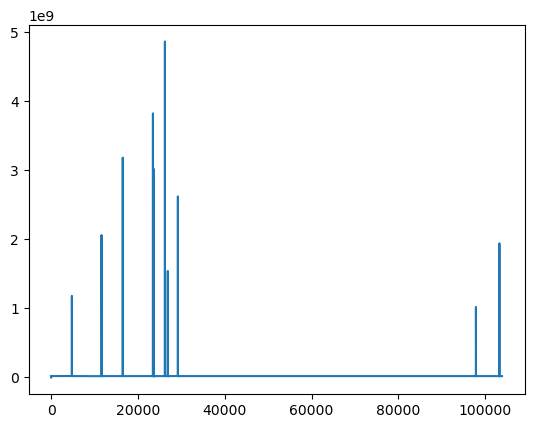

In [9]:
# There are occasional large differences, so let's check if this is due to missing timestamps, or if the timestamps are not evenly spaced
time_diff.plot()
plt.show()

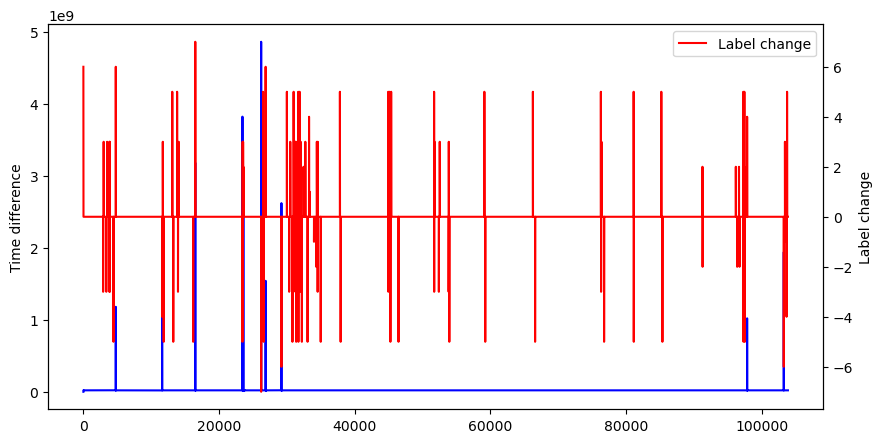

In [10]:
# Let's add to this graph the points where the label changes
# There are 6 labels in the dataset, we will plot them in different colors
label_changes = har70plus_1_df['label'].diff()

# The first label change is NaN, so we will fill it with the first label
label_changes[0] = har70plus_1_df['label'][0]

# Plot the time differences and the label changes
# The axis scales are different, so two y-axes are needed
plt.figure(figsize=(10, 5))

#
plt.plot(time_diff, 'b', label='Time difference')
plt.ylabel('Time difference')
plt.twinx()

plt.plot(label_changes, 'r', label='Label change')
plt.ylabel('Label change')
plt.legend()


plt.show()

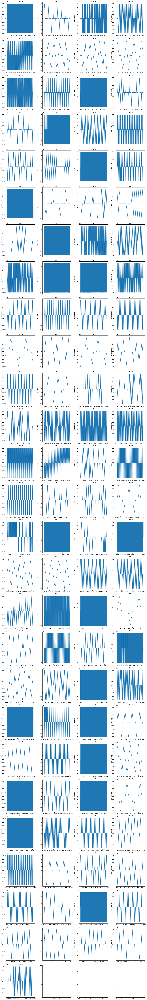

In [11]:
# The large time differences appear to line up with some of the label changes, but not every label change is associated with a large time difference
# This suggests that the timestamps are not evenly spaced, but the time differences are not due to missing timestamps

# Lets split the dataset by each change in the label and check the time differences in each subset
# We will plot the time differences for each subset

# Find the indices where the label changes
label_change_indices = har70plus_1_df.index[label_changes != 0]

# Add the last index to the list of changes
label_change_indices = label_change_indices.append(pd.Index([har70plus_1_df.index[-1]]))

# Split the dataset by the label changes
label_change_splits = [har70plus_1_df.iloc[label_change_indices[i]:label_change_indices[i+1]] for i in range(len(label_change_indices) - 1)]

# Plot each split on a separate graph in a grid
n_plots = len(label_change_splits)

num_per_row = 4
n_rows = n_plots // num_per_row + n_plots % num_per_row

fig, axs = plt.subplots(n_rows, num_per_row, figsize=(20, 5 * n_rows))

for i, split in enumerate(label_change_splits):
    split = split.copy()
    split['timestamp'] = pd.to_datetime(split['timestamp'])
    split_time_diff = split['timestamp'].diff()
    
    # Only plot the time differences, ignore the first NaN
    split_time_diff = split_time_diff.iloc[1:]
    
    ax = axs[i // num_per_row, i % num_per_row]
    ax.plot(split_time_diff)
    ax.set_title(f"Label: {split['label'].iloc[0]}")
    ax.set_ylabel('Time difference')
    
plt.tight_layout()
plt.show()    

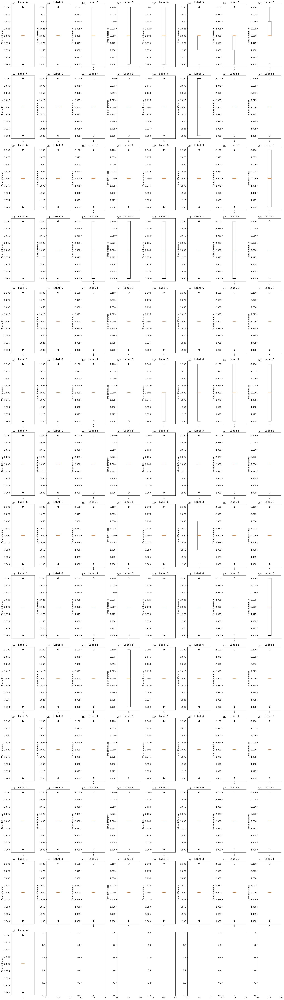

In [12]:
#The time differences within each label are more consistent, but there is still a range of values, which suggests that the timestamps are not evenly spaced
# Let's plot a boxplot of the time differences for each split

num_per_row = 8
n_rows = n_plots // num_per_row + n_plots % num_per_row

fig, axs = plt.subplots(n_rows, num_per_row, figsize=(20, 5 * n_rows))

for i, split in enumerate(label_change_splits):
    split = split.copy()
    split['timestamp'] = pd.to_datetime(split['timestamp'])
    split_time_diff = split['timestamp'].diff()
    
    # Only plot the time differences, ignore the first NaN
    split_time_diff = split_time_diff.iloc[1:]
    
    ax = axs[i // num_per_row, i % num_per_row]
    ax.boxplot(split_time_diff)
    ax.set_title(f"Label: {split['label'].iloc[0]}")
    ax.set_ylabel('Time difference')
    
plt.tight_layout()
plt.show()
    

For most of the box plots, the range of time differences is small, but there are occasional outliers

This likely indicates a roughly consistent sampling rate, but with occasional delays or missed samples

This should mean that the data can be mostly treated as a time series, but with some caution, and some augmentation of the models may be necessary to handle the continuous nature of the data. This may lend itself nicely to the ESNs, along with augmentation such as attention mechanisms, or differential equations.

In [13]:
# Let's now check the HARTH dataset for the same issues
harth_files = os.path.join(data_path, 'harth')

harth_files = [os.path.join(harth_files, f) for f in os.listdir(harth_files) if f.endswith('.csv')]

harth_1_df = pd.read_csv(harth_files[0])

harth_1_df.head()

,timestamp,back_x,back_y,back_z,thigh_x,thigh_y,thigh_z,label
0,2019-01-12 00:00:00.000,-0.760242,0.299570,0.468570,-5.092732,-0.298644,0.709439,6
1,2019-01-12 00:00:00.010,-0.530138,0.281880,0.319987,0.900547,0.286944,0.340309,6
2,2019-01-12 00:00:00.020,-1.170922,0.186353,-0.167010,-0.035442,-0.078423,-0.515212,6
3,2019-01-12 00:00:00.030,-0.648772,0.016579,-0.054284,-1.554248,-0.950978,-0.221140,6
4,2019-01-12 00:00:00.040,-0.355071,-0.051831,-0.113419,-0.547471,0.140903,-0.653782,6


In [14]:
# Convert the timestamp to a datetime object
harth_1_df['timestamp'] = pd.to_datetime(harth_1_df['timestamp'])

# Calculate the difference between each pair of timestamps
time_diff = harth_1_df['timestamp'].diff()

# The first difference is NaN, so let's fill it with 0 as the difference between the first and the first timestamp is 0
time_diff[0] = pd.Timedelta(0)

# Check if the difference is constant
time_diff.value_counts()

timestamp
0 days 00:00:00.010000    408670
0 days 00:00:00.550000         2
0 days 00:00:01.870000         2
0 days 00:00:01.630000         2
0 days 00:00:01.430000         2
0 days 00:00:01.130000         1
0 days 00:00:01.890000         1
0 days 00:00:02.670000         1
0 days 00:00:01.990000         1
0 days 00:00:02.070000         1
0 days 00:00:01.490000         1
0 days 00:00:00.530000         1
0 days 00:00:01.110000         1
0 days 00:00:01.750000         1
0 days 00:00:03.110000         1
0 days 00:00:02.750000         1
0 days 00:00:01.160000         1
0 days 00:00:01.050000         1
0 days 00:00:00                1
0 days 00:00:02.320000         1
0 days 00:00:17.690000         1
0 days 00:00:04.940000         1
0 days 00:00:00.990000         1
0 days 00:00:02.410000         1
0 days 00:00:01.810000         1
0 days 00:00:05.120000         1
0 days 00:00:01.270000         1
0 days 00:00:02.250000         1
0 days 00:00:01.190000         1
0 days 00:00:01.410000         1


In [15]:
# The difference is not constant, we need to check the distribution of the differences
time_diff.describe()


count                       408709
mean     0 days 00:00:00.010210002
std      0 days 00:00:00.034593988
min                0 days 00:00:00
25%         0 days 00:00:00.010000
50%         0 days 00:00:00.010000
75%         0 days 00:00:00.010000
max         0 days 00:00:17.690000
Name: timestamp, dtype: object

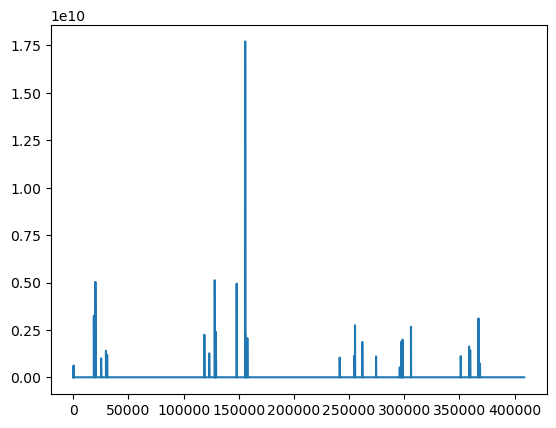

In [16]:
# There are occasional large differences, so let's check if this is due to missing timestamps, or if the timestamps are not evenly spaced
time_diff.plot()
plt.show()


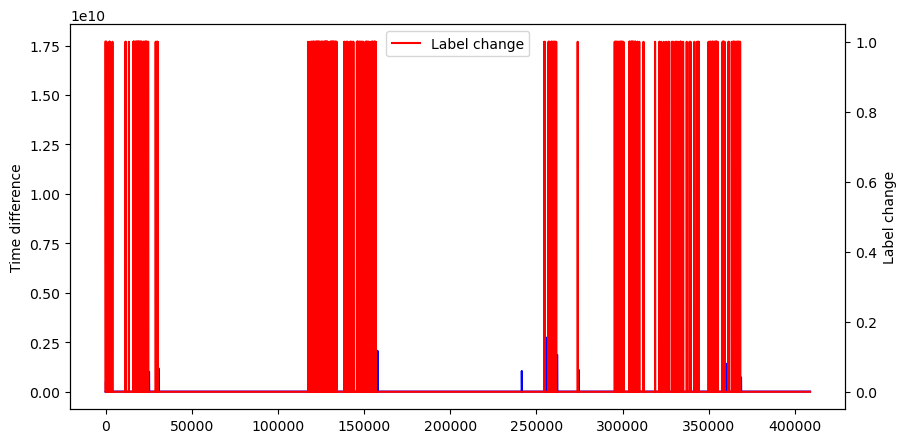

In [17]:
# Let's add to this graph the points where the label changes
# There are 12 activities, coded with specific numbers (1,2,3,4,5,6,7,8,13,14,140,130)
# We will plot them in different colors
label_changes = harth_1_df['label'].diff()

# The first label change is NaN, so we will fill it with the first label
label_changes[0] = harth_1_df['label'][0]

# As the label changes can be small or large depending on the values, let's set any change to 1
label_changes[label_changes != 0] = 1

# Plot the time differences and the label changes
# The axis scales are different, so two y-axes are needed

plt.figure(figsize=(10, 5))

plt.plot(time_diff, 'b', label='Time difference')
plt.ylabel('Time difference')
plt.twinx()

plt.plot(label_changes, 'r', label='Label change')
plt.ylabel('Label change')
plt.legend()

plt.show()

In [18]:
# The large time differences appear to line up with some of the label changes, but not every label change is associated with a large time difference
# This suggests that the timestamps are not evenly spaced, but the time differences are not due to missing timestamps

# Lets split the dataset by each change in the label and check the time differences in each subset
# We will plot the time differences for each subset

# Find the indices where the label changes
label_change_indices = harth_1_df.index[label_changes != 0]

# Add the last index to the list of changes
label_change_indices = label_change_indices.append(pd.Index([harth_1_df.index[-1]]))

# Split the dataset by the label changes
label_change_splits = [harth_1_df.iloc[label_change_indices[i]:label_change_indices[i+1]] for i in range(len(label_change_indices) - 1)]

# Plot each split on a separate graph in a grid
n_plots = len(label_change_splits)

num_per_row = 8
n_rows = n_plots // num_per_row + n_plots % num_per_row

fig, axs = plt.subplots(n_rows, num_per_row, figsize=(20, 5 * n_rows))

for i, split in enumerate(label_change_splits):
    split = split.copy()
    split['timestamp'] = pd.to_datetime(split['timestamp'])
    split_time_diff = split['timestamp'].diff()
    
    # Only plot the time differences, ignore the first NaN
    split_time_diff = split_time_diff.iloc[1:]
    
    ax = axs[i // num_per_row, i % num_per_row]
    ax.plot(split_time_diff)
    ax.set_title(f"Label: {split['label'].iloc[0]}")
    ax.set_ylabel('Time difference')
    
plt.tight_layout()
plt.show()

In [19]:
# The time differences within each label are mostly very consistent, but there are occasional outliers. This could be attributed to missed samples or delays in the data collection process.

In [20]:
# Let's plot a boxplot of the time differences for each split

num_per_row = 8
n_rows = n_plots // num_per_row + n_plots % num_per_row

fig, axs = plt.subplots(n_rows, num_per_row, figsize=(20, 5 * n_rows))

for i, split in enumerate(label_change_splits):
    split = split.copy()
    split['timestamp'] = pd.to_datetime(split['timestamp'])
    split_time_diff = split['timestamp'].diff()
    
    # Only plot the time differences, ignore the first NaN
    split_time_diff = split_time_diff.iloc[1:]
    
    ax = axs[i // num_per_row, i % num_per_row]
    ax.boxplot(split_time_diff)
    ax.set_title(f"Label: {split['label'].iloc[0]}")
    ax.set_ylabel('Time difference')
    
plt.tight_layout()
plt.show()

Now that the time differences have been checked, the next step is to explore the data itself to see how it changes over time, and to see if there are any patterns that can be exploited in the machine learning models.

Starting with the HAR70+ dataset, we will plot the accelerometer data, with the line segments colored by the label.

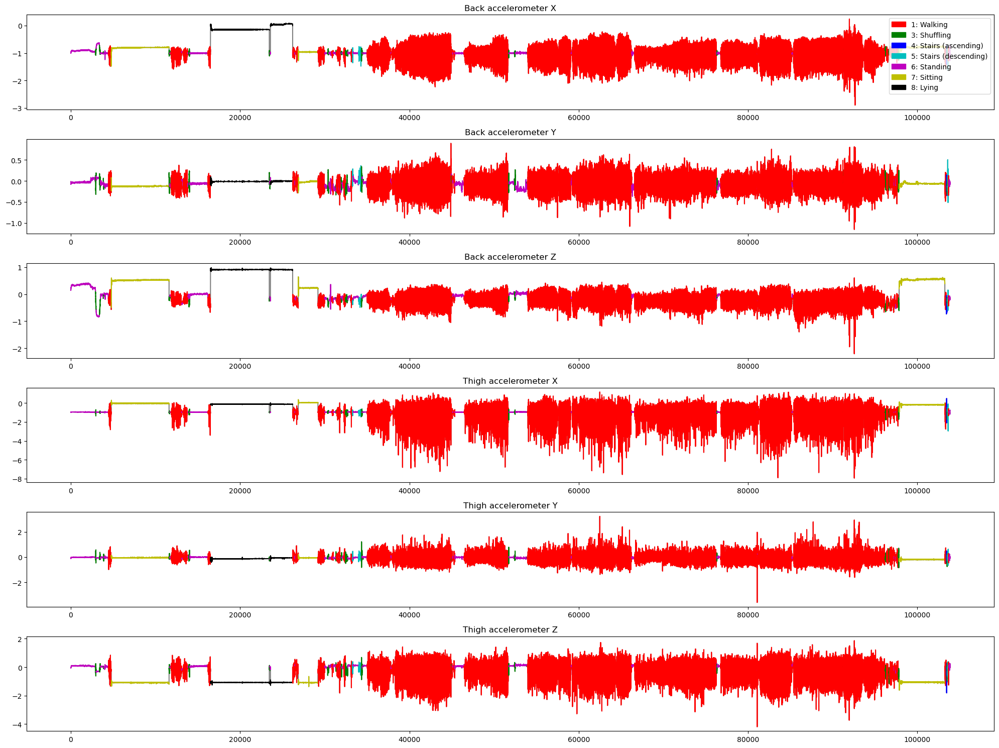

In [67]:
label_cmap = {
    1: 'r',
    3: 'g',
    4: 'b',
    5: 'c',
    6: 'm',
    7: 'y',
    8: 'k'
}

colour_labels = har70plus_1_df['label'].map(label_cmap)

fig, axs = plt.subplots(6, 1, figsize=(20, 15))

axs[0].plot(har70plus_1_df.index, har70plus_1_df['back_x'], 'gray', label='X')
axs[1].plot(har70plus_1_df['back_y'], 'gray', label='Y')
axs[2].plot(har70plus_1_df['back_z'], 'gray', label='Z')

axs[3].plot(har70plus_1_df['thigh_x'], 'gray', label='X')
axs[4].plot(har70plus_1_df['thigh_y'], 'gray', label='Y')
axs[5].plot(har70plus_1_df['thigh_z'], 'gray', label='Z')

# The data changes label as time progresses, so we need to split the data by change in label, and then iterate over each split
# to plot the data with the corresponding label color
label_diff = har70plus_1_df['label'].diff()

label_change_indices = har70plus_1_df.index[label_diff != 0]

label_change_indices = label_change_indices.append(pd.Index([har70plus_1_df.index[-1]]))

label_splits = [har70plus_1_df.iloc[label_change_indices[i]:label_change_indices[i+1]] for i in range(len(label_change_indices) - 1)]

for label_split in label_splits:
    color = label_cmap[label_split['label'].iloc[0]]
    label_data = label_split.copy()
    axs[0].plot(label_data.index, label_data['back_x'], color=color)
    axs[1].plot(label_data['back_y'], color=color)
    axs[2].plot(label_data['back_z'], color=color)
    
    axs[3].plot(label_data['thigh_x'], color=color)
    axs[4].plot(label_data['thigh_y'], color=color)
    axs[5].plot(label_data['thigh_z'], color=color)
    
# Add a legend for the labels with corresponding colours from label_cmap
labels = {
    1: 'Walking',
    3: 'Shuffling',
    4: 'Stairs (ascending)',
    5: 'Stairs (descending)',
    6: 'Standing',
    7: 'Sitting',
    8: 'Lying'
}

label_patches = [matplotlib.patches.Patch(color=color, label=f"{label}: {labels[label]}") for label, color in label_cmap.items()]

# All plots share the same legend, so only add it to the first plot
axs[0].legend(handles=label_patches, loc='upper right')

# Add a title to each plot
axs[0].set_title('Back accelerometer X')
axs[1].set_title('Back accelerometer Y')
axs[2].set_title('Back accelerometer Z')

axs[3].set_title('Thigh accelerometer X')
axs[4].set_title('Thigh accelerometer Y')
axs[5].set_title('Thigh accelerometer Z')

plt.tight_layout()
plt.show()

In [ ]:
# The data is quite noisy, but there are some patterns that can be seen, such as walking is much noisier than lying down, and the stationary activities are relatively smooth.

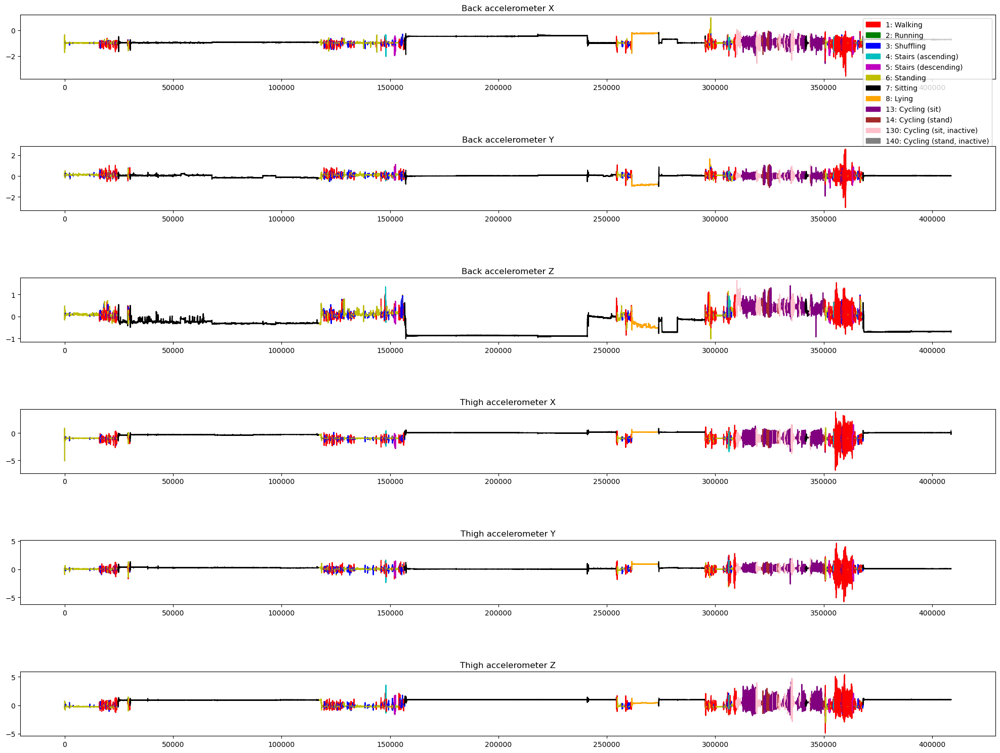

In [68]:
# Let's now plot the accelerometer data for the HARTH dataset
label_cmap = {
    1: 'r',
    2: 'g',
    3: 'b',
    4: 'c',
    5: 'm',
    6: 'y',
    7: 'k',
    8: 'orange',
    13: 'purple',
    14: 'brown',
    130: 'pink',
    140: 'gray'
}

colour_labels = harth_1_df['label'].map(label_cmap)

fig, axs = plt.subplots(6, 1, figsize=(20, 15))

axs[0].plot(harth_1_df.index, harth_1_df['back_x'], 'gray', label='X')
axs[1].plot(harth_1_df['back_y'], 'gray', label='Y')
axs[2].plot(harth_1_df['back_z'], 'gray', label='Z')

axs[3].plot(harth_1_df['thigh_x'], 'gray', label='X')
axs[4].plot(harth_1_df['thigh_y'], 'gray', label='Y')
axs[5].plot(harth_1_df['thigh_z'], 'gray', label='Z')

# The data changes label as time progresses, so we need to split the data by change in label, and then iterate over each split
# to plot the data with the corresponding label color
label_diff = harth_1_df['label'].diff()

label_change_indices = harth_1_df.index[label_diff != 0]

label_change_indices = label_change_indices.append(pd.Index([harth_1_df.index[-1]]))

label_splits = [harth_1_df.iloc[label_change_indices[i]:label_change_indices[i+1]] for i in range(len(label_change_indices) - 1)]

for label_split in label_splits:
    color = label_cmap[label_split['label'].iloc[0]]
    label_data = label_split.copy()
    axs[0].plot(label_data.index, label_data['back_x'], color=color)
    axs[1].plot(label_data['back_y'], color=color)
    axs[2].plot(label_data['back_z'], color=color)
    
    axs[3].plot(label_data['thigh_x'], color=color)
    axs[4].plot(label_data['thigh_y'], color=color)
    axs[5].plot(label_data['thigh_z'], color=color)
    
# Add a legend for the labels with corresponding colours from label_cmap
# 1: walking	
# 2: running
# 3: shuffling
# 4: stairs (ascending)
# 5: stairs (descending)
# 6: standing
# 7: sitting
# 8: lying
# 13: cycling (sit)
# 14: cycling (stand)
# 130: cycling (sit, inactive)
# 140: cycling (stand, inactive)
labels = {
    1: 'Walking',
    2: 'Running',
    3: 'Shuffling',
    4: 'Stairs (ascending)',
    5: 'Stairs (descending)',
    6: 'Standing',
    7: 'Sitting',
    8: 'Lying',
    13: 'Cycling (sit)',
    14: 'Cycling (stand)',
    130: 'Cycling (sit, inactive)',
    140: 'Cycling (stand, inactive)'
}

label_patches = [matplotlib.patches.Patch(color=color, label=f"{label}: {labels[label]}") for label, color in label_cmap.items()]

# All plots share the same legend, so only add it to the first plot
axs[0].legend(handles=label_patches, loc='upper right')

# Add a title to each plot
axs[0].set_title('Back accelerometer X')
axs[1].set_title('Back accelerometer Y')
axs[2].set_title('Back accelerometer Z')

axs[3].set_title('Thigh accelerometer X')
axs[4].set_title('Thigh accelerometer Y')
axs[5].set_title('Thigh accelerometer Z')

plt.tight_layout()
plt.show()

In [ ]:
# The data is quite noisy, but there are some patterns that can be seen, such as activities involving movement being noisier than stationary activities, which is logical.

In [80]:
# Next, as there are multiple files in each dataset, we will load all of them and plot the data for each file
collector = DataframeCollector()
collector.load_full_dataset(data_path + '/har70plus')

Discovered  18  csv files in  E:\PyCharm\COM6906-Dissertation\data/har70plus
Loading the csv files into dataframes
Loaded  18  dataframes
Concatenating the dataframes


,timestamp,back_x,back_y,back_z,thigh_x,thigh_y,thigh_z,label,record_num
0,2021-03-24 14:42:03.839,-0.999023,-0.063477,0.140625,-0.980469,-0.112061,-0.048096,6,0
1,2021-03-24 14:42:03.859,-0.980225,-0.079346,0.140625,-0.961182,-0.121582,-0.051758,6,1
2,2021-03-24 14:42:03.880,-0.950195,-0.076416,0.140625,-0.949463,-0.080566,-0.067139,6,2
3,2021-03-24 14:42:03.900,-0.954834,-0.059082,0.140381,-0.957520,-0.046143,-0.050781,6,3
4,2021-03-24 14:42:03.920,-0.972412,-0.042969,0.142822,-0.977051,-0.023682,-0.026611,6,4
...,...,...,...,...,...,...,...,...,...
2259592,2021-06-11 11:13:14.098,-0.960693,-0.199951,-0.330566,-0.977051,0.006104,-0.246826,1,2259592
2259593,2021-06-11 11:13:14.118,-0.942627,-0.210205,-0.331543,-0.969482,0.004883,-0.231445,1,2259593
2259594,2021-06-11 11:13:14.138,-0.907227,-0.190918,-0.320312,-1.048096,0.067627,-0.234375,1,2259594
2259595,2021-06-11 11:13:14.159,-0.883057,-0.156982,-0.311279,-1.007080,0.063965,-0.248047,1,2259595


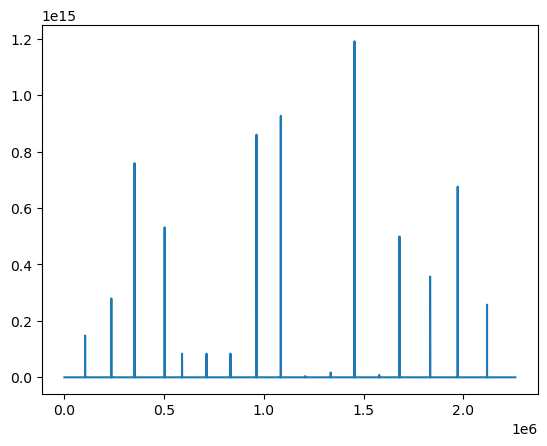

In [81]:
# Lets take a look at the timestamp differences for the full dataset
har70plus_df = collector.get_collected_data()

har70plus_df['timestamp'] = pd.to_datetime(har70plus_df['timestamp'])

time_diff = har70plus_df['timestamp'].diff()

time_diff[0] = pd.Timedelta(0)

time_diff.plot()

plt.show()

In [82]:
time_diff.describe()

count                      2259597
mean     0 days 00:00:03.015170554
std      0 days 00:24:32.069157130
min                0 days 00:00:00
25%         0 days 00:00:00.020000
50%         0 days 00:00:00.020000
75%         0 days 00:00:00.020000
max        13 days 18:49:46.701000
Name: timestamp, dtype: object

In [83]:
time_diff.median()

Timedelta('0 days 00:00:00.020000')

The median time difference is 0.02 seconds, which is roughly 50 Hz, so the data is sampled at around 50 Hz.
The time differences appear to be relatively similar to the first file, with occasional outliers, but the majority of the data is consistent.

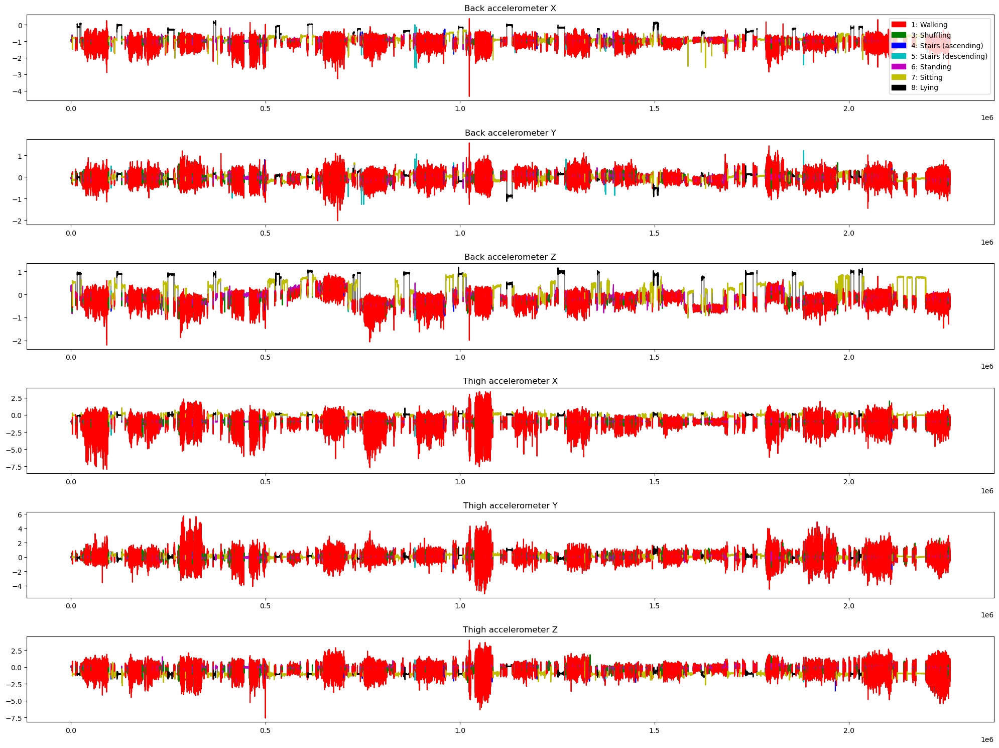

In [85]:
#Let's plot the accelerometer data for the full dataset
label_cmap = {
    1: 'r',
    3: 'g',
    4: 'b',
    5: 'c',
    6: 'm',
    7: 'y',
    8: 'k'
}

colour_labels = har70plus_df['label'].map(label_cmap)

fig, axs = plt.subplots(6, 1, figsize=(20, 15))

axs[0].plot(har70plus_df.index, har70plus_df['back_x'], 'gray', label='X')
axs[1].plot(har70plus_df['back_y'], 'gray', label='Y')
axs[2].plot(har70plus_df['back_z'], 'gray', label='Z')

axs[3].plot(har70plus_df['thigh_x'], 'gray', label='X')
axs[4].plot(har70plus_df['thigh_y'], 'gray', label='Y')
axs[5].plot(har70plus_df['thigh_z'], 'gray', label='Z')

# The data changes label as time progresses, so we need to split the data by change in label, and then iterate over each split
# to plot the data with the corresponding label color
label_diff = har70plus_df['label'].diff()

label_change_indices = har70plus_df.index[label_diff != 0]

label_change_indices = label_change_indices.append(pd.Index([har70plus_df.index[-1]]))

label_splits = [har70plus_df.iloc[label_change_indices[i]:label_change_indices[i+1]] for i in range(len(label_change_indices) - 1)]

for label_split in label_splits:
    color = label_cmap[label_split['label'].iloc[0]]
    label_data = label_split.copy()
    axs[0].plot(label_data.index, label_data['back_x'], color=color)
    axs[1].plot(label_data['back_y'], color=color)
    axs[2].plot(label_data['back_z'], color=color)
    
    axs[3].plot(label_data['thigh_x'], color=color)
    axs[4].plot(label_data['thigh_y'], color=color)
    axs[5].plot(label_data['thigh_z'], color=color)
    
# Add a legend for the labels with corresponding colours from label_cmap
labels = {
    1: 'Walking',
    3: 'Shuffling',
    4: 'Stairs (ascending)',
    5: 'Stairs (descending)',
    6: 'Standing',
    7: 'Sitting',
    8: 'Lying'
}

label_patches = [matplotlib.patches.Patch(color=color, label=f"{label}: {labels[label]}") for label, color in label_cmap.items()]

# All plots share the same legend, so only add it to the first plot
axs[0].legend(handles=label_patches, loc='upper right')

# Add a title to each plot
axs[0].set_title('Back accelerometer X')
axs[1].set_title('Back accelerometer Y')
axs[2].set_title('Back accelerometer Z')

axs[3].set_title('Thigh accelerometer X')
axs[4].set_title('Thigh accelerometer Y')
axs[5].set_title('Thigh accelerometer Z')

plt.tight_layout()
plt.show()

In [86]:
# It appears a lot of the data is classified as walking, but let's get the distribution of the labels to confirm
har70plus_df['label'].value_counts()

label
1    1079312
7     483452
6     418055
8     203182
3      66058
5       4978
4       4560
Name: count, dtype: int64

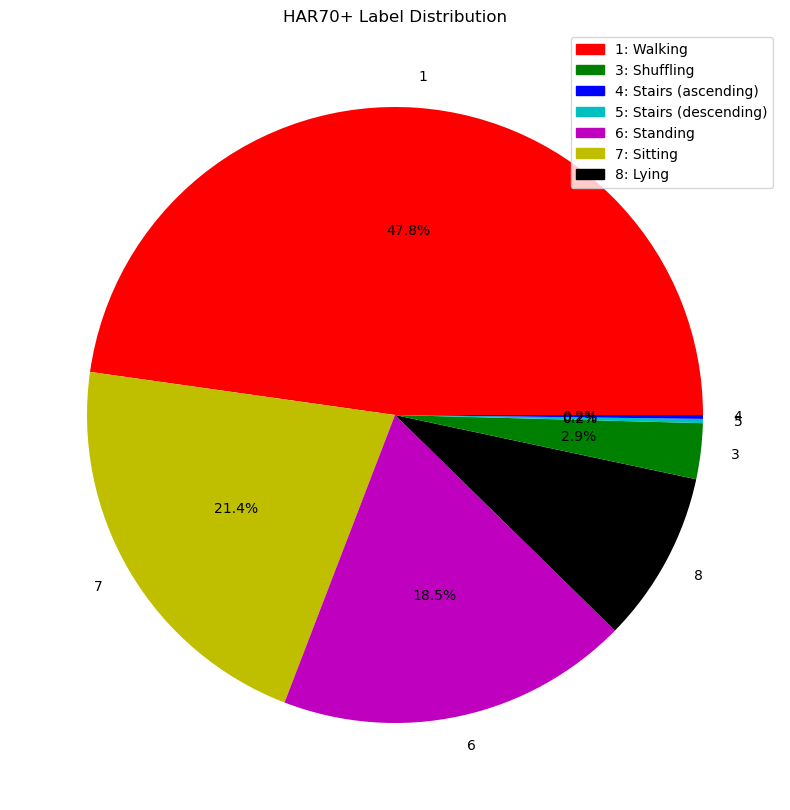

In [89]:
# Lets plot that as a pie chart
label_counts = har70plus_df['label'].value_counts()

# Make sure the label colors are consistent with the previous plots
label_cmap = {
    1: 'r',
    3: 'g',
    4: 'b',
    5: 'c',
    6: 'm',
    7: 'y',
    8: 'k'
}

label_colors = [label_cmap[label] for label in label_counts.index]

plt.figure(figsize=(10, 10))
plt.pie(label_counts, labels=label_counts.index, colors=label_colors, autopct='%1.1f%%')

# Add a title
plt.title('HAR70+ Label Distribution')

# Add a legend for the labels
label_patches = [matplotlib.patches.Patch(color=color, label=f"{label}: {labels[label]}") for label, color in label_cmap.items()]
plt.legend(handles=label_patches, loc='upper right')

plt.show()

In [90]:
# This confirms that the majority of the data is classified as walking, with the other activities being less common.
# Let's get a list of the distributions as a percentage
label_counts / label_counts.sum() * 100

print("HAR70+ Label Distribution:")
print(label_counts / label_counts.sum() * 100)

HAR70+ Label Distribution:
label
1    47.765686
7    21.395497
6    18.501308
8     8.991957
3     2.923442
5     0.220305
4     0.201806
Name: count, dtype: float64


In [91]:
# This is likely to lead to class imbalance issues, so we may need to consider techniques to handle this, such as oversampling, undersampling, or using class weights in the models.
# This is useful to be aware of when designing the models, as it may affect the choice of model or the hyperparameters.

In [92]:
# Now let's load the HARTH dataset
collector = DataframeCollector()

collector.load_full_dataset(data_path + '/harth')

Discovered  22  csv files in  E:\PyCharm\COM6906-Dissertation\data/harth
Loading the csv files into dataframes
Loaded  22  dataframes
Concatenating the dataframes


,timestamp,back_x,back_y,back_z,thigh_x,thigh_y,thigh_z,label,record_num,index,Unnamed: 0
0,2019-01-12 00:00:00.000,-0.760242,0.299570,0.468570,-5.092732,-0.298644,0.709439,6,0,NaN,NaN
1,2019-01-12 00:00:00.010,-0.530138,0.281880,0.319987,0.900547,0.286944,0.340309,6,1,NaN,NaN
2,2019-01-12 00:00:00.020,-1.170922,0.186353,-0.167010,-0.035442,-0.078423,-0.515212,6,2,NaN,NaN
3,2019-01-12 00:00:00.030,-0.648772,0.016579,-0.054284,-1.554248,-0.950978,-0.221140,6,3,NaN,NaN
4,2019-01-12 00:00:00.040,-0.355071,-0.051831,-0.113419,-0.547471,0.140903,-0.653782,6,4,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
6461323,2019-01-12 00:59:56.940,-1.012939,-0.110840,-0.218994,-0.970215,-0.313232,0.124268,3,6461323,NaN,NaN
6461324,2019-01-12 00:59:56.960,-0.979492,-0.089355,-0.216553,-0.966553,-0.234619,0.113770,3,6461324,NaN,NaN
6461325,2019-01-12 00:59:56.980,-0.969971,-0.057861,-0.204590,-0.997803,-0.097656,0.065186,3,6461325,NaN,NaN
6461326,2019-01-12 00:59:57.000,-1.001953,-0.029785,-0.234863,-1.000000,-0.145996,0.061523,3,6461326,NaN,NaN


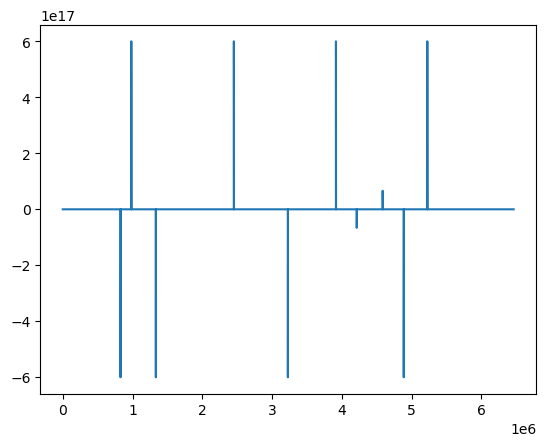

In [93]:
# Lets take a look at the timestamp differences for the full dataset
harth_df = collector.get_collected_data()

harth_df['timestamp'] = pd.to_datetime(harth_df['timestamp'])

time_diff = harth_df['timestamp'].diff()

time_diff[0] = pd.Timedelta(0)

time_diff.plot()

plt.show()

In [ ]:
# The time differences are similar to the first file, with occasional outliers, but the majority of the data is consistent.

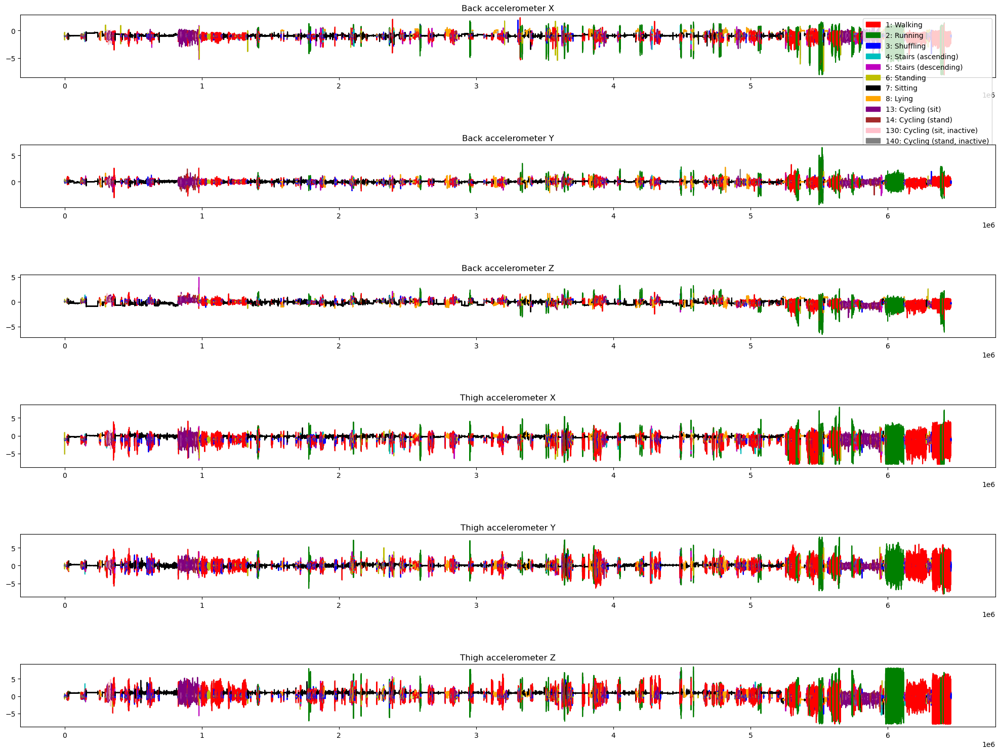

In [94]:
# Let's plot the accelerometer data for the full dataset
label_cmap = {
    1: 'r',
    2: 'g',
    3: 'b',
    4: 'c',
    5: 'm',
    6: 'y',
    7: 'k',
    8: 'orange',
    13: 'purple',
    14: 'brown',
    130: 'pink',
    140: 'gray'
}

colour_labels = harth_df['label'].map(label_cmap)

fig, axs = plt.subplots(6, 1, figsize=(20, 15))

axs[0].plot(harth_df.index, harth_df['back_x'], 'gray', label='X')
axs[1].plot(harth_df['back_y'], 'gray', label='Y')
axs[2].plot(harth_df['back_z'], 'gray', label='Z')

axs[3].plot(harth_df['thigh_x'], 'gray', label='X')
axs[4].plot(harth_df['thigh_y'], 'gray', label='Y')
axs[5].plot(harth_df['thigh_z'], 'gray', label='Z')

# The data changes label as time progresses, so we need to split the data by change in label, and then iterate over each split
# to plot the data with the corresponding label color

label_diff = harth_df['label'].diff()

label_change_indices = harth_df.index[label_diff != 0]

label_change_indices = label_change_indices.append(pd.Index([harth_df.index[-1]]))

label_splits = [harth_df.iloc[label_change_indices[i]:label_change_indices[i+1]] for i in range(len(label_change_indices) - 1)]

for label_split in label_splits:
    color = label_cmap[label_split['label'].iloc[0]]
    label_data = label_split.copy()
    axs[0].plot(label_data.index, label_data['back_x'], color=color)
    axs[1].plot(label_data['back_y'], color=color)
    axs[2].plot(label_data['back_z'], color=color)
    
    axs[3].plot(label_data['thigh_x'], color=color)
    axs[4].plot(label_data['thigh_y'], color=color)
    axs[5].plot(label_data['thigh_z'], color=color)
    
# Add a legend for the labels with corresponding colours from label_cmap

labels = {
    1: 'Walking',
    2: 'Running',
    3: 'Shuffling',
    4: 'Stairs (ascending)',
    5: 'Stairs (descending)',
    6: 'Standing',
    7: 'Sitting',
    8: 'Lying',
    13: 'Cycling (sit)',
    14: 'Cycling (stand)',
    130: 'Cycling (sit, inactive)',
    140: 'Cycling (stand, inactive)'
}

label_patches = [matplotlib.patches.Patch(color=color, label=f"{label}: {labels[label]}") for label, color in label_cmap.items()]

# All plots share the same legend, so only add it to the first plot
axs[0].legend(handles=label_patches, loc='upper right')

# Add a title to each plot
axs[0].set_title('Back accelerometer X')
axs[1].set_title('Back accelerometer Y')
axs[2].set_title('Back accelerometer Z')

axs[3].set_title('Thigh accelerometer X')
axs[4].set_title('Thigh accelerometer Y')
axs[5].set_title('Thigh accelerometer Z')

plt.tight_layout()
plt.show()

In [96]:
# There looks like there is a reasonable amount of data for most labels, but let's check the distribution of the labels to confirm
harth_df['label'].value_counts()

label
7      2902703
1      1197155
6       743480
8       428898
13      393963
2       291356
3       254839
4        76217
5        67253
14       55814
130      41785
140       7865
Name: count, dtype: int64

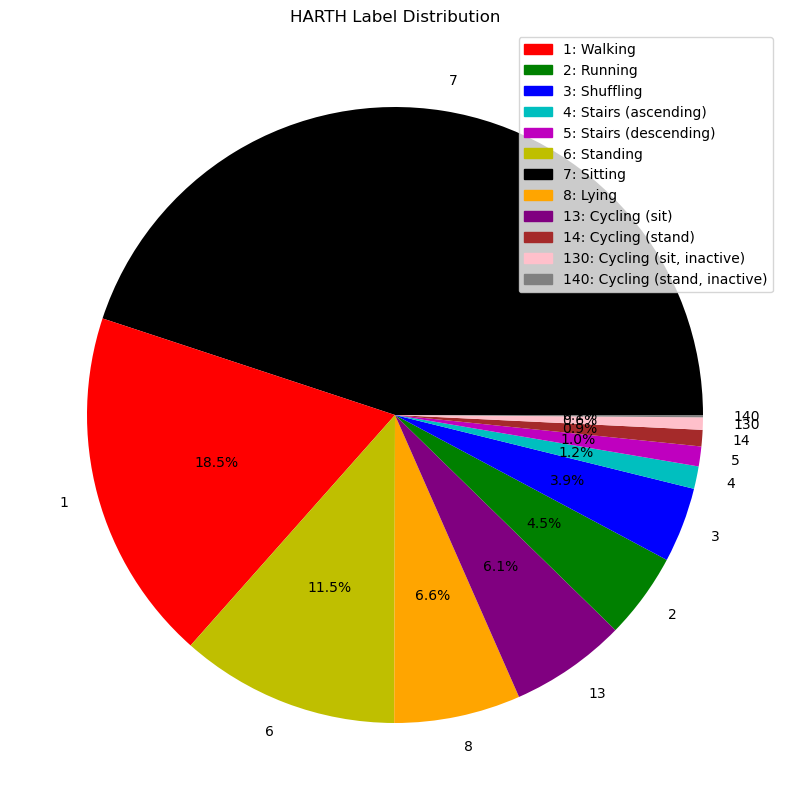

In [95]:
# Lets plot that as a pie chart

label_counts = harth_df['label'].value_counts()

# Make sure the label colors are consistent with the previous plots
label_cmap = {
    1: 'r',
    2: 'g',
    3: 'b',
    4: 'c',
    5: 'm',
    6: 'y',
    7: 'k',
    8: 'orange',
    13: 'purple',
    14: 'brown',
    130: 'pink',
    140: 'gray'
}

label_colors = [label_cmap[label] for label in label_counts.index]

plt.figure(figsize=(10, 10))

plt.pie(label_counts, labels=label_counts.index, colors=label_colors, autopct='%1.1f%%')

# Add a title
plt.title('HARTH Label Distribution')

# Add a legend for the labels
label_patches = [matplotlib.patches.Patch(color=color, label=f"{label}: {labels[label]}") for label, color in label_cmap.items()]

plt.legend(handles=label_patches, loc='upper right')

plt.show()


In [97]:
# Interestingly, it appears the largest portion of the data is classified as sitting, with the other activities being less common.
# This could affect the performance of the models, as the majority class is much larger than the others.
# Let's get a list of the distributions as a percentage
label_counts / label_counts.sum() * 100

print("HARTH Label Distribution:")
print(label_counts / label_counts.sum() * 100)

HARTH Label Distribution:
label
7      44.924248
1      18.528002
6      11.506613
8       6.637923
13      6.097245
2       4.509228
3       3.944065
4       1.179587
5       1.040854
14      0.863816
130     0.646694
140     0.121724
Name: count, dtype: float64
